In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.colors import LinearSegmentedColormap

sns.set_style("whitegrid")

In [273]:
import matplotlib 
matplotlib.rc_file_defaults()

In [2]:
dict_cellline_to_msi = {
    # Colon/Colorectal cancer
 'CCK81_LARGE_INTESTINE': 'MSI',
 'HCC56_LARGE_INTESTINE': 'MSS',
 'HT55_LARGE_INTESTINE': 'MSS',
 'LS180_LARGE_INTESTINE': 'MSI',
 'LS1034_LARGE_INTESTINE': 'MSS',
 'NCIH747_LARGE_INTESTINE': 'MSS', # MSI-L
 'OUMS23_LARGE_INTESTINE': 'MSS',
 'RCM1_LARGE_INTESTINE': 'MSS',
 'SNUC4_LARGE_INTESTINE' : 'MSI',
 'CL34_LARGE_INTESTINE' : 'MSI', # https://www.nature.com/articles/ncomms8002#MOESM559

    # Endometrial cancer
 'EFE184_ENDOMETRIUM' : 'MSS', # https://pmc.ncbi.nlm.nih.gov/articles/PMC3016101/
 'HEC108_ENDOMETRIUM' : 'MSI',
 'HEC151_ENDOMETRIUM' : 'MSI',
 'HEC251_ENDOMETRIUM' : 'MSS', # POLE, https://pmc.ncbi.nlm.nih.gov/articles/PMC9322587/
 'HEC59_ENDOMETRIUM' : 'MSI',
 'HEC6_ENDOMETRIUM' : 'MSI',
 'MFE280_ENDOMETRIUM' : 'MSS',
 'MFE319_ENDOMETRIUM' : 'MSI',
 'SNU1077_ENDOMETRIUM' : 'N/A',
 'TEN_ENDOMETRIUM' : 'N/A',


   # Gastric cancer
 '2313287_STOMACH' : 'MSI',
 'IM95_STOMACH' : 'MSI', # https://pmc.ncbi.nlm.nih.gov/articles/PMC9022268/
 'LMSU_STOMACH': 'N/A',
 'MKN45_STOMACH' : 'MSS',
 'MKN7_STOMACH': 'MSS', # https://www.nature.com/articles/3700117
 'SH10TC_STOMACH' : 'MSS', # Not surely MSS, but likely to be MSS https://pmc.ncbi.nlm.nih.gov/articles/PMC8694418/#sec012
 
   # Pancreatic cancer
 'ASPC1_PANCREAS' : 'MSS',
 'HUPT3_PANCREAS' : 'MSS',
 'HUPT4_PANCREAS' : 'MSS',
 'PANC1_PANCREAS' : 'N/A',
 'SW1990_PANCREAS': 'MSS',
 'DANG_PANCREAS': 'MSS',
 'PK59_PANCREAS': 'N/A',
 'PANC0203_PANCREAS': 'MSS',
 'PATU8988S_PANCREAS': 'N/A',
 'PK45H_PANCREAS': 'N/A',
 'SU8686_PANCREAS' : 'MSS',
 
  # Lung cancer
 'NCIH727_LUNG': 'MSS',
 'NCIH2077_LUNG': 'N/A',
 'NCIH2087_LUNG': 'MSS',
 'NCIH1568_LUNG': 'MSS',
 'NCIH1048_LUNG': 'MSI', # MSI-H
 'NCIH1944_LUNG': 'MSS',
 'NCIH358_LUNG': 'MSS',
 'NCIH522_LUNG': 'MSS',
 'NCIH1792_LUNG': 'MSS',
 'CALU6_LUNG': 'MSS',

 'KPL1_BREAST': 'MSS',
 'MSTO211H_PLEURA': 'MSS',

 'SKMEL30_SKIN': 'MSS',
 'HS939T_SKIN': 'MSS',
 'HUH6_LIVER': 'N/A',
 'GOS3_CENTRAL_NERVOUS_SYSTEM': 'N/A',
 'KYSE520_OESOPHAGUS': 'MSS',
 'ZR751_BREAST': 'N/A',
 'VMRCRCZ_KIDNEY': 'MSS',
 'HS852T_SKIN': 'N/A',
 'T47D_BREAST': 'MSS',
 'COLO792_SKIN': 'MSS',
 'HCC1419_BREAST': 'MSS',
 'TOV21G_OVARY': 'MSI', # MSI-H
 'HS729_SOFT_TISSUE': 'N/A',
 'TE6_OESOPHAGUS': 'MSS',
 'SNU738_CENTRAL_NERVOUS_SYSTEM': 'N/A',
 'OVTOKO_OVARY': 'MSS',
 'RD_SOFT_TISSUE': 'MSS',
 'PC3_PROSTATE': 'MSS',
 'TCCSUP_URINARY_TRACT': 'MSS',
 'OVSAHO_OVARY': 'N/A',
 'SNU423_LIVER': 'MSS',
 'JHOS2_OVARY': 'MSS',
 'EFM192A_BREAST': 'MSS',
 'RVH421_SKIN': 'MSS',
 'KMRC3_KIDNEY': 'N/A',
 'TE1_OESOPHAGUS': 'MSS',
 }

In [3]:
def saveWithPickle(obj, PATH_out, filename="saveWithPickle"):
    import pickle
    with open(f'{PATH_out}/{filename}.pickle', 'wb') as handle:
        pickle.dump(obj, handle, protocol=pickle.HIGHEST_PROTOCOL)

def loadFromPickle(dir_pickle):
    import pickle
    with open(dir_pickle, 'rb') as handle:
        unserialized_pickle = pickle.load(handle)
    return unserialized_pickle

## All cell lines

In [19]:
adata_t = sc.read_h5ad('/node200data/18parkky/datasets/data/public/processed_data/Kinker_et_al/CPM_data.metalabeled.h5ad')

In [22]:
adata_t.var.index = adata_t.var['GENE']
adata_t.var.index.name = None

In [25]:
sc.pp.normalize_total(adata_t)
sc.pp.log1p(adata_t)
sc.pp.highly_variable_genes(adata_t, n_top_genes=2000, batch_key="PoolID")

adata_t.raw = adata_t.copy()
adata_t = adata_t[:, adata_t.var.highly_variable]

sc.pp.scale(adata_t, max_value=10)
sc.tl.pca(adata_t, svd_solver="arpack")

/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [30]:
sc.pp.neighbors(adata_t, n_neighbors=15, n_pcs=40)
sc.tl.umap(adata_t, random_state=42)  # spread set to 0.2 to clutter cells as closely as possible

/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


In [34]:
adata_t.obs['GroundTruth'] = [ dict_cellline_to_msi[CL] for CL in adata_t.obs['CellLine'] ]

KeyError: 'NCIH2126_LUNG'

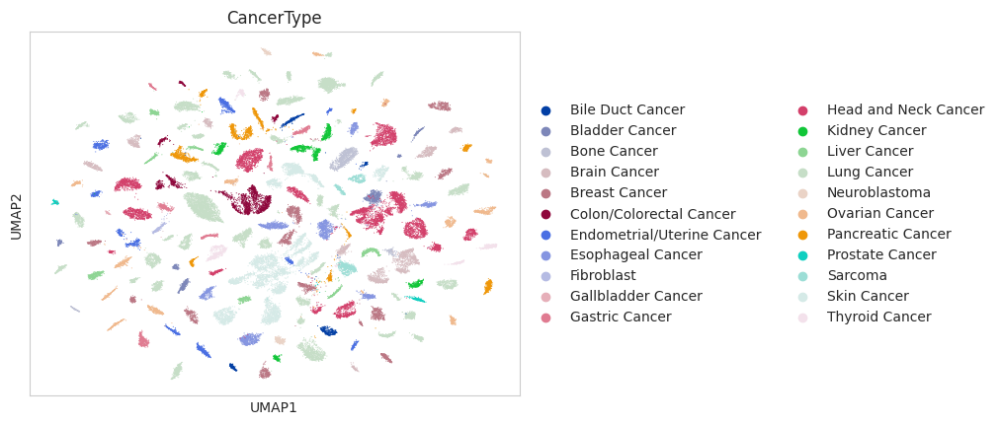

In [33]:
sc.pl.umap(adata_t, color=['CancerType',], ncols=1)

## MSI-prevalent cancers

### Re-process using Scanpy

In [5]:
DIR_dataset = '/Volumes/1TB_M.2/datasets'
DIR_dataset = '/node200data/18parkky/datasets'

In [6]:
adata = sc.read_h5ad(f'{DIR_dataset}/data/public/processed_data/Kinker_et_al/CPM_data.scanpy_preprocessed.CRC-GC-EC.h5ad')
adata = adata.raw.to_adata()

In [7]:
set(adata.obs['CancerType'])

{'Colon/Colorectal Cancer', 'Endometrial/Uterine Cancer', 'Gastric Cancer'}

In [8]:
adata.var.index = adata.var['GENE']
adata.var.index.name = None

In [9]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key="PoolID")

adata.raw = adata.copy()
adata = adata[:, adata.var.highly_variable]

sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver="arpack")

/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [10]:
sc.pp.neighbors(adata, n_neighbors=5, n_pcs=40) # neighbor set to 5 to clutter cells as closely as possible
sc.tl.umap(adata, random_state=42, spread=0.2)  # spread set to 0.2 to clutter cells as closely as possible

2025-02-19 16:22:36.964498: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-19 16:22:37.021113: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-02-19 16:22:37.518247: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-02-19 16:22:37.666735: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-19 16:22:37.859266: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been 

In [ ]:
    # sc.pl.umap(adata, color=['AvgSTRDiff_scaled'],
    #            vmin=-2, vmax=2, cmap='vlag_r', alpha=0.75, frameon=False, colorbar_loc=None, title='')

In [17]:
adata.obs['GroundTruth'] = [ dict_cellline_to_msi[CL] for CL in adata.obs['CellLine'] ]

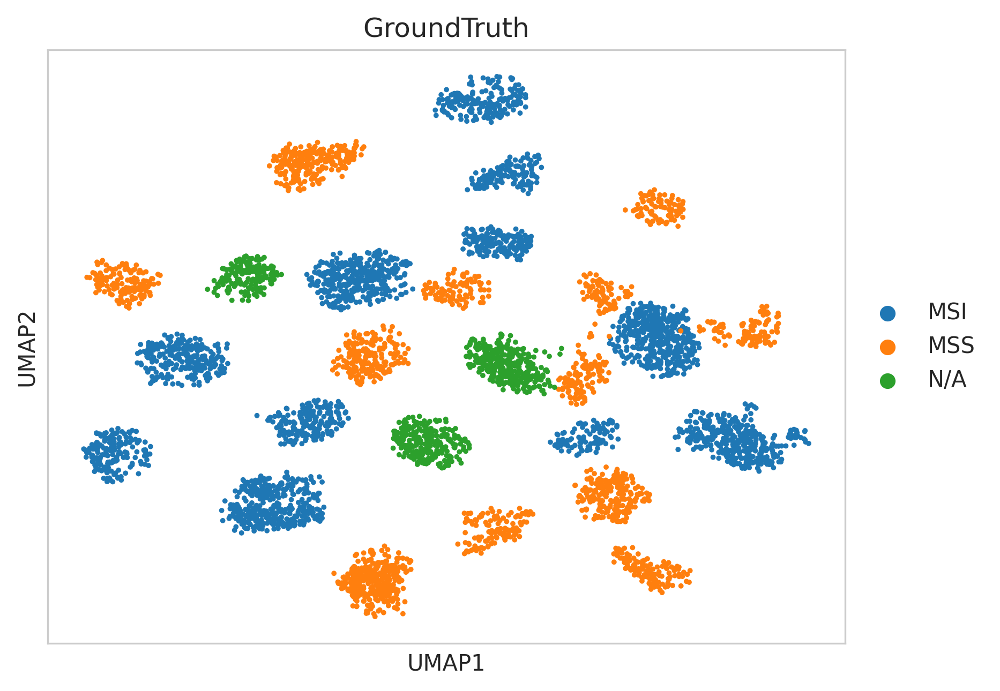

In [18]:
with plt.rc_context({"figure.dpi": (300)}):
    sc.pl.umap(adata, color=['GroundTruth'], ncols=1)

### Load and overlay NanoMnT results

In [ ]:
AlleleTable = pd.read_csv(f'{DIR_dataset}/data/public/processed_data/Kinker_et_al/AlleleTable.merged.tsv.gz', sep='\t')
AlleleTable.rename( {'read_STR_length' : 'read_STR_allele'}, axis=1, inplace=True )
AlleleTable['PoolID'] = [ str(pi.split('_')[1]) for pi in AlleleTable['pool_id'] ]

#### Filter out low-quality STR reads

In [53]:
orig_length = AlleleTable.shape[0]

In [54]:
### 1. Filter out low-quality flankings (e.g., indels within flankings)        
col_flanking_quality = list()
for tup2 in AlleleTable.itertuples():
    bf = f'{tup2.left_flanking_seq}{tup2.right_flanking_seq}'
    if '*' in bf:
        col_flanking_quality.append( 'Poor' )
    elif bf.upper() != bf:
        col_flanking_quality.append( 'Poor' )
    else:
        col_flanking_quality.append( 'Good' )
AlleleTable['flanking_quality'] = col_flanking_quality
AlleleTable = AlleleTable[(AlleleTable['flanking_quality']=='Good')].copy()
print(f'{round(100*len(AlleleTable)/orig_length, 2)} %')        

### 2. Filter out G/C repeats
AlleleTable = AlleleTable[(AlleleTable['repeat_unit'].isin(['A', 'T']))].copy()
print(f'{round(100*len(AlleleTable)/orig_length, 2)} %')        

### 3. Filter out reads without CB or UMI
AlleleTable.dropna(inplace=True,)
AlleleTable = AlleleTable[AlleleTable['reference_STR_allele']<=24].copy()
print(f'{round(100*len(AlleleTable)/orig_length, 2)} %')

AlleleTable['diff'] = AlleleTable['read_STR_allele'] - AlleleTable['reference_STR_allele']

89.3 %
88.65 %
84.85 %


In [56]:
AlleleTable.to_csv(f'{DIR_dataset}/data/public/processed_data/Kinker_et_al/AlleleTable.merged.preprocessed.tsv.gz', sep='\t', compression='gzip')

In [36]:
AlleleTable = pd.read_csv(f'{DIR_dataset}/data/public/processed_data/Kinker_et_al/AlleleTable.merged.preprocessed.tsv.gz', sep='\t')

#### Overlay results

In [37]:
AlleleTable.reset_index(inplace=True, drop=True)

In [38]:
adata.obs['Identifier'] = [ f'{tup.CB.split("-")[0]}-{tup.PoolID}' for tup in adata.obs.itertuples() ]
len(adata.obs), len(set(adata.obs['Identifier']))

(5431, 5431)

In [ ]:
AlleleTable['Identifier'] = [ f'{tup.CB.split("-")[0]}-{tup.PoolID}' for tup in AlleleTable.itertuples() ]

In [ ]:
dict_Identifier_to_STRprofile = dict()

for Identifier, edf in AlleleTable.groupby("Identifier"):
    edf_o = edf['diff'].dropna()
    if len(edf_o) > 0:
        dict_Identifier_to_STRprofile[Identifier] = [ np.mean(edf_o), np.std(edf_o), len(edf_o) ]

# saveWithPickle(dict_Identifier_to_STRprofile, '/Volumes/1TB_M.2/datasets/data/public/processed_data/Kinker_et_al', 'dict_Identifier_to_STRprofile')

In [ ]:
for Identifier in adata.obs['Identifier']:
    try: dict_Identifier_to_STRprofile[Identifier]
    except KeyError: dict_Identifier_to_STRprofile[Identifier]=[0, 0, 0]

In [ ]:
adata.obs['AvgSTRDiff'] = [ dict_Identifier_to_STRprofile[Identifier][0] for Identifier in adata.obs['Identifier'] ]
adata.obs['StdSTRDiff'] = [ dict_Identifier_to_STRprofile[Identifier][1] for Identifier in adata.obs['Identifier'] ]
adata.obs['NumSTRLoci'] = [ dict_Identifier_to_STRprofile[Identifier][2] for Identifier in adata.obs['Identifier'] ]

In [ ]:
u, s = np.mean( adata.obs['AvgSTRDiff'] ), np.std( adata.obs['AvgSTRDiff'] )
adata.obs['AvgSTRDiff_scaled'] = [ (ASD-u)/s for ASD in adata.obs['AvgSTRDiff'] ]

u, s = np.mean( adata.obs['StdSTRDiff'] ), np.std( adata.obs['StdSTRDiff'] )
adata.obs['StdSTRDiff_scaled'] = [ (ASD-u)/s for ASD in adata.obs['StdSTRDiff'] ]

In [ ]:
adata.obs['MSI_status'] = [ dict_cellline_to_msi[CL] for CL in adata.obs['CellLine'] ]

In [39]:
adata.write(f'{DIR_dataset}/data/public/processed_data/Kinker_et_al/CPM_data.scanpy_preprocessed.CRC-GC-EC.NanoMNT_labeled.h5ad')

In [40]:
adata = sc.read_h5ad(f'{DIR_dataset}/data/public/processed_data/Kinker_et_al/CPM_data.scanpy_preprocessed.CRC-GC-EC.NanoMNT_labeled.h5ad')

### Visualize results

In [89]:
adata.obs['MSI_score'] = [ -(tup.AvgSTRDiff*tup.StdSTRDiff) for tup in adata.obs.itertuples() ]
MSI_score_u, MSI_score_s = np.mean( adata.obs['MSI_score'] ), np.std( adata.obs['MSI_score'] )
adata.obs['MSI_score_scaled'] = [ (ms-MSI_score_u)/MSI_score_s for ms in adata.obs['MSI_score'] ]

/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


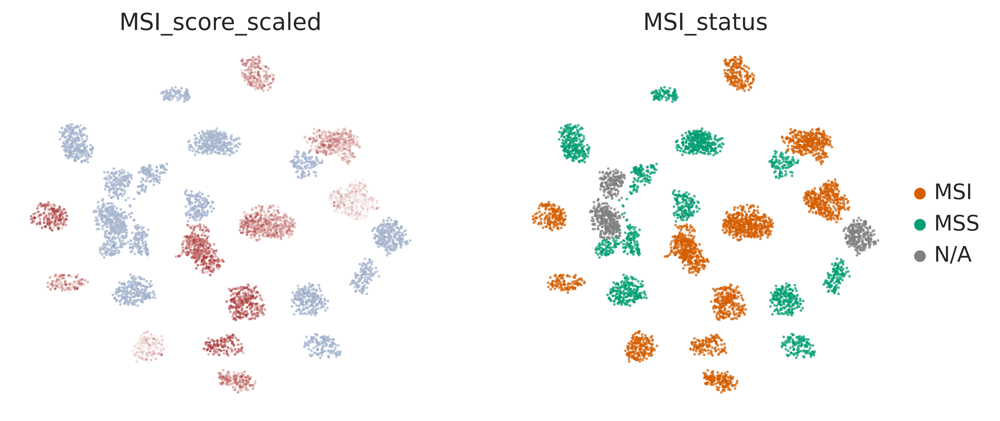

In [91]:
sc.set_figure_params(dpi=300, frameon=False, transparent=False)
sc.pl.umap(adata[(adata.obs['NumSTRLoci']!=0)], color=['MSI_score_scaled', 'MSI_status',], 
           ncols=2,
           cmap='vlag',
           vmin=-2, vmax=2, # -2σ ~ 2σ 
            palette={ 
                'MSI' : sns.color_palette('colorblind')[3], 
                'MSS' : sns.color_palette('colorblind')[2], 
                'N/A' : 'gray'
                }, 
           colorbar_loc=None,
           alpha=0.75, 
           s=10,
           )

In [68]:
MSIscoreByCellLine = { CellLine : abs(np.mean(edf['AvgSTRDiff'])*np.mean(edf['StdSTRDiff'])) for CellLine, edf in adata.obs.groupby('CellLine') }
adata.obs['MSI_score'] = [ MSIscoreByCellLine[CL] for CL in adata.obs['CellLine'] ]  

/tmp/ipykernel_8633/1842369334.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  MSIscoreByCellLine = { CellLine : abs(np.mean(edf['AvgSTRDiff'])*np.mean(edf['StdSTRDiff'])) for CellLine, edf in adata.obs.groupby('CellLine') }


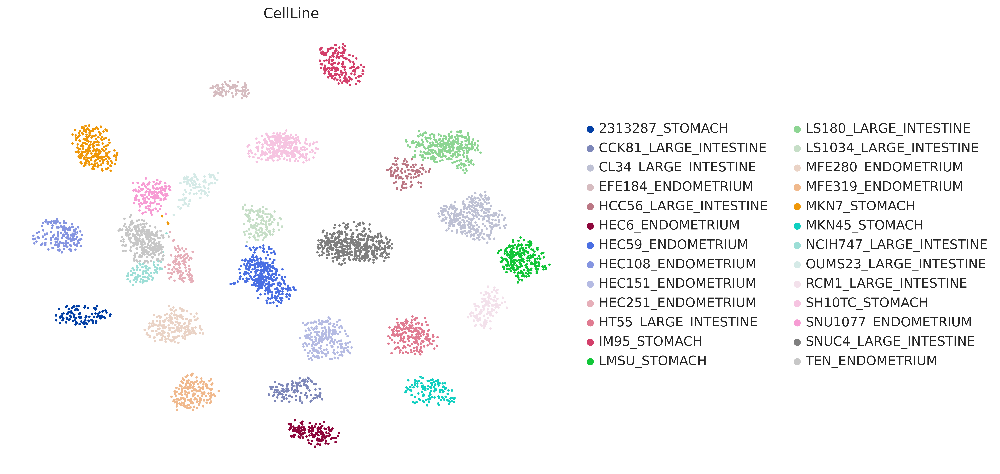

In [108]:
sc.set_figure_params(figsize=(10, 8), dpi=300, frameon=False, transparent=False)
sc.pl.umap(adata, color=['CellLine'])

In [264]:
sns.set_style('whitegrid')

In [267]:
fig, axes = plt.subplots(1, 2, figsize=(7.5, 10), sharex=False, sharey=True, dpi=500)
OrderByMSIIntensity = adata.obs.groupby(['CellLine'])['MSI_score'].aggregate(np.mean).reset_index().sort_values('MSI_score')
ax = sns.barplot(data=adata.obs, 
            y='CellLine', 
            x='MSI_score', 
            order=OrderByMSIIntensity['CellLine'],
            hue='MSI_status', 
            palette={ 
                'MSI' : sns.color_palette('colorblind')[3], 
                'MSS' : sns.color_palette('colorblind')[2], 
                'N/A' : 'gray'
                },             
            legend=None, ax=axes[0]
            )
ax.xaxis.set_major_locator(ticker.MultipleLocator(5))
ax.xaxis.set_major_formatter(ticker.ScalarFormatter())
# ax.set_yticklabels([]);

ax = sns.barplot(data=adata.obs, 
            y='CellLine', 
            x='MSI_score_scaled', 
            order=OrderByMSIIntensity['CellLine'],
            hue='MSI_status', 
            palette={ 
                'MSI' : sns.color_palette('colorblind')[3], 
                'MSS' : sns.color_palette('colorblind')[2], 
                'N/A' : 'gray'
                }, 
            legend=True, 
            ax=axes[1]
            )
# ax.set_yticklabels([]);
ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
ax.xaxis.set_major_formatter(ticker.ScalarFormatter())

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1), title='')

/tmp/ipykernel_8633/4195070304.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  OrderByMSIIntensity = adata.obs.groupby(['CellLine'])['MSI_score'].aggregate(np.mean).reset_index().sort_values('MSI_score')
/tmp/ipykernel_8633/4195070304.py:2: FutureWarning: The provided callable <function mean at 0x7fbe185c5120> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  OrderByMSIIntensity = adata.obs.groupby(['CellLine'])['MSI_score'].aggregate(np.mean).reset_index().sort_values('MSI_score')


In [287]:
sns.set_style('whitegrid')

/tmp/ipykernel_8633/3392127701.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  OrderByMSIIntensity = adata.obs.groupby(['CellLine'])['MSI_score'].aggregate(np.mean).reset_index().sort_values('MSI_score')
/tmp/ipykernel_8633/3392127701.py:2: FutureWarning: The provided callable <function mean at 0x7fbe185c5120> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  OrderByMSIIntensity = adata.obs.groupby(['CellLine'])['MSI_score'].aggregate(np.mean).reset_index().sort_values('MSI_score')


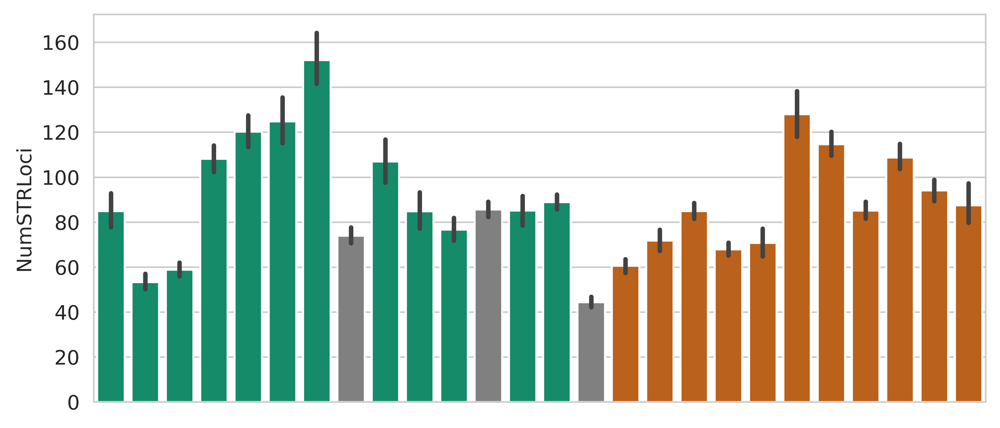

In [289]:
plt.figure(figsize=(8, 3.5), dpi=400)
OrderByMSIIntensity = adata.obs.groupby(['CellLine'])['MSI_score'].aggregate(np.mean).reset_index().sort_values('MSI_score')
ax = sns.barplot(data=adata.obs, 
            x='CellLine', 
            y='NumSTRLoci', 
            order=OrderByMSIIntensity['CellLine'],
            hue='MSI_status', 
            palette={ 
                'MSI' : sns.color_palette('colorblind')[3], 
                'MSS' : sns.color_palette('colorblind')[2], 
                'N/A' : 'gray'
                },             
            legend=None, 
            )
# ax.xaxis.set_major_locator(ticker.MultipleLocator(5))
# ax.xaxis.set_major_formatter(ticker.ScalarFormatter())
# ax.set_yticklabels([]);
# ax.set_ylabel('');
ax.set_xticklabels([]);
ax.set_xlabel('');
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1), title='')

In [119]:
sns.color_palette('colorblind')

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

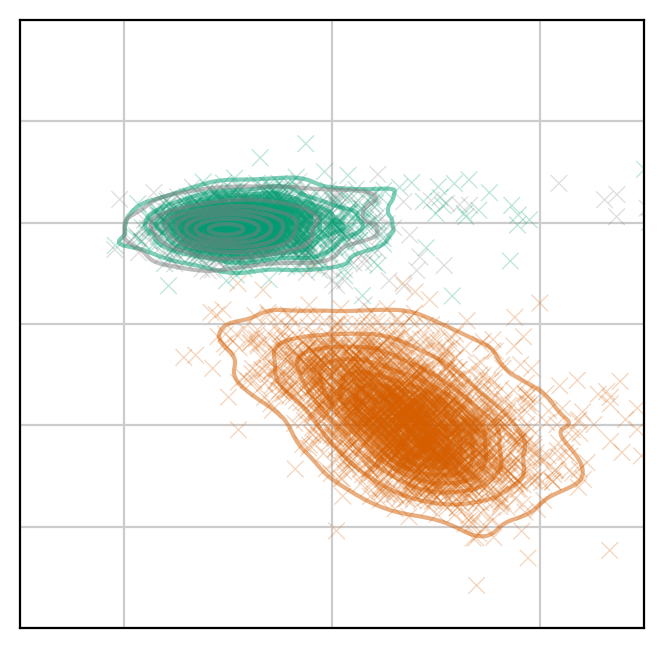

In [121]:
plt.figure(figsize=(4, 4), dpi=100)

ax = sns.kdeplot(data=adata.obs[adata.obs['NumSTRLoci']>=10], 
                x='StdSTRDiff_scaled', 
                y='AvgSTRDiff_scaled', 
                palette={ 
                    'MSI' : sns.color_palette('colorblind')[3], 
                    'MSS' : sns.color_palette('colorblind')[2], 
                    'N/A' : 'gray'
                    }, 
                alpha=0.5,
                hue='MSI_status', 
                legend=None,
                )
ax = sns.scatterplot(data=adata.obs[adata.obs['NumSTRLoci']>=10], 
                x='StdSTRDiff_scaled', 
                y='AvgSTRDiff_scaled', 
                palette={ 
                    'MSI' : sns.color_palette('colorblind')[3], 
                    'MSS' : sns.color_palette('colorblind')[2], 
                    'N/A' : 'gray'
                    }, 
                    marker='x',
                alpha=0.25, hue='MSI_status', 
                legend=None,
                )
ax.set_xlim([-3, 3]);
ax.set_ylim([-3, 3]);

ax.set_xticklabels([]);
ax.set_xlabel('');
ax.set_yticklabels([]);
ax.set_ylabel('');

## Specificity & Sensitivity visualization

In [ ]:
adata.obs.reset_index(inplace=True, drop=True)
adata.obs.reset_index(inplace=True,)

In [ ]:
adata.obs['MSI_score_log'] = [ np.log(ms) for ms in adata.obs['MSI_score'] ]

In [173]:
adata.obs['index'] = [ str(i) for i in adata.obs['index'] ]

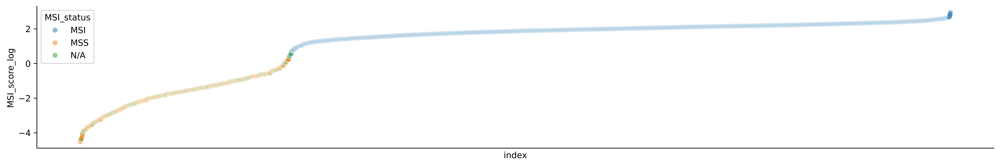

In [176]:
plt.figure(figsize=(20, 3), dpi=500)
ax = sns.scatterplot(data=adata.obs.sort_values('MSI_score'), x='index', y='MSI_score_log', alpha=0.5, hue='MSI_status')
ax.set_xticks([]);
ax.set_xticklabels([]);
sns.despine()

In [270]:
threshold_start_value = -1
threshold_final_value = 10

IdentificationResults = list() 

adata_2 = adata.obs[adata.obs['MSI_status']!='N/A']

for i in range(0, 100*(threshold_final_value-threshold_start_value)+1):
    increment = i*0.01
    threshold = threshold_start_value + increment
    
    TP, TN, FP, FN = 0, 0, 0, 0
    
    for tup in adata_2.itertuples():
        if tup.MSI_status == 'MSI':
            if tup.MSI_score >= threshold:
                TP += 1
            else:
                FN += 1
        
        elif tup.MSI_status == 'MSS':
            if tup.MSI_score >= threshold:
                FP += 1
            else:
                TN += 1

    IdentificationResults.append( [threshold, TP/(TP+FN), TN/(TN+FP)] )
    
IdentificationResults = pd.DataFrame(IdentificationResults, columns=['threshold', 'sensitivity', 'specificity'])

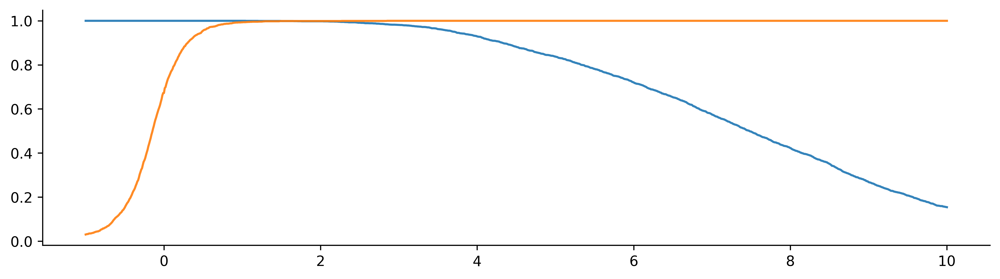

In [280]:
plt.figure(figsize=(12, 3), dpi=300)
sns.lineplot(data=IdentificationResults, x='threshold', y='sensitivity', alpha=0.9,)
ax = sns.lineplot(data=IdentificationResults, x='threshold', y='specificity', alpha=0.9,)
ax.set_xlabel('');
ax.set_ylabel('');
# ax.set_xticklabels([]);
# ax.set_yticklabels([]);
sns.despine()

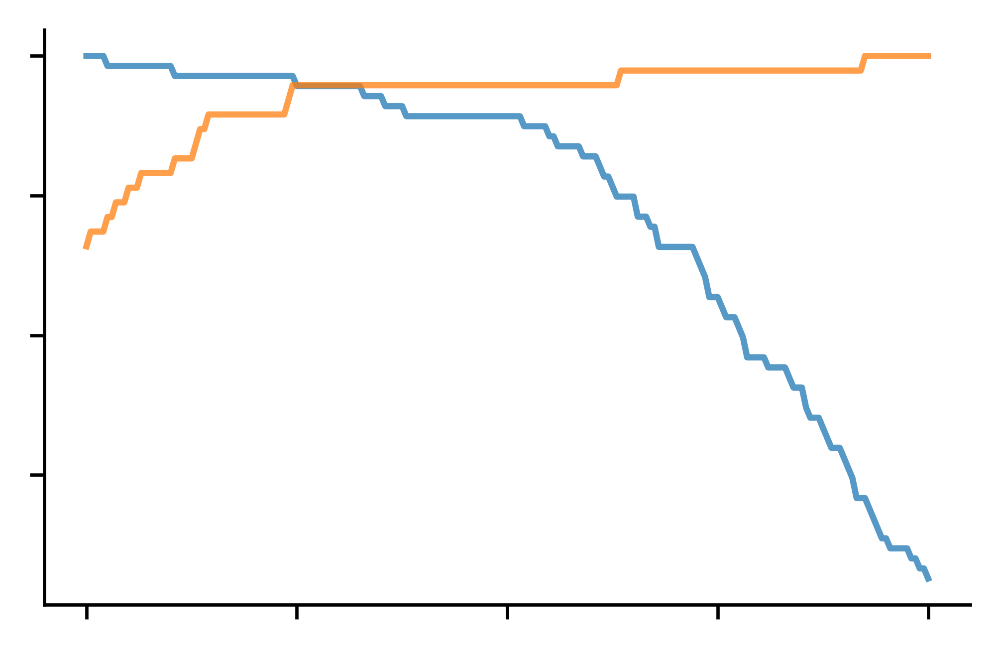

In [279]:
plt.figure(figsize=(4, 2.5), dpi=300)
ax = sns.lineplot(data=IdentificationResults[(IdentificationResults['threshold']>=1) & (IdentificationResults['threshold']<=3)], x='threshold', y='sensitivity', 
                  alpha=0.75,)
ax = sns.lineplot(data=IdentificationResults[(IdentificationResults['threshold']>=1) & (IdentificationResults['threshold']<=3)], x='threshold', y='specificity',
                  alpha=0.75,)
ax.set_xticklabels([]);
ax.set_xlabel('');
ax.set_yticklabels([]);
# ax.set_xticks([]);
ax.set_ylabel('');
sns.despine()

In [208]:
threshold_start_value = 1
threshold_final_value = 3

IdentificationResults = list() 

adata_2 = adata.obs[adata.obs['MSI_status']!='N/A']

resolution = 1000

for i in range(0, resolution*(threshold_final_value-threshold_start_value)+1):
    increment = i/resolution
    threshold = threshold_start_value + increment
    
    TP, TN, FP, FN = 0, 0, 0, 0
    
    for tup in adata_2.itertuples():
        if tup.MSI_status == 'MSI':
            if tup.MSI_score >= threshold:
                TP += 1
            else:
                FN += 1
        
        elif tup.MSI_status == 'MSS':
            if tup.MSI_score >= threshold:
                FP += 1
            else:
                TN += 1

    IdentificationResults.append( [threshold, TP/(TP+FN), TN/(TN+FP)] )
    
IdentificationResults = pd.DataFrame(IdentificationResults, columns=['threshold', 'sensitivity', 'specificity'])

## NanoMnT performance on MS loci counts

PearsonRResult(statistic=0.02282653916156474, pvalue=0.3189807029823462)

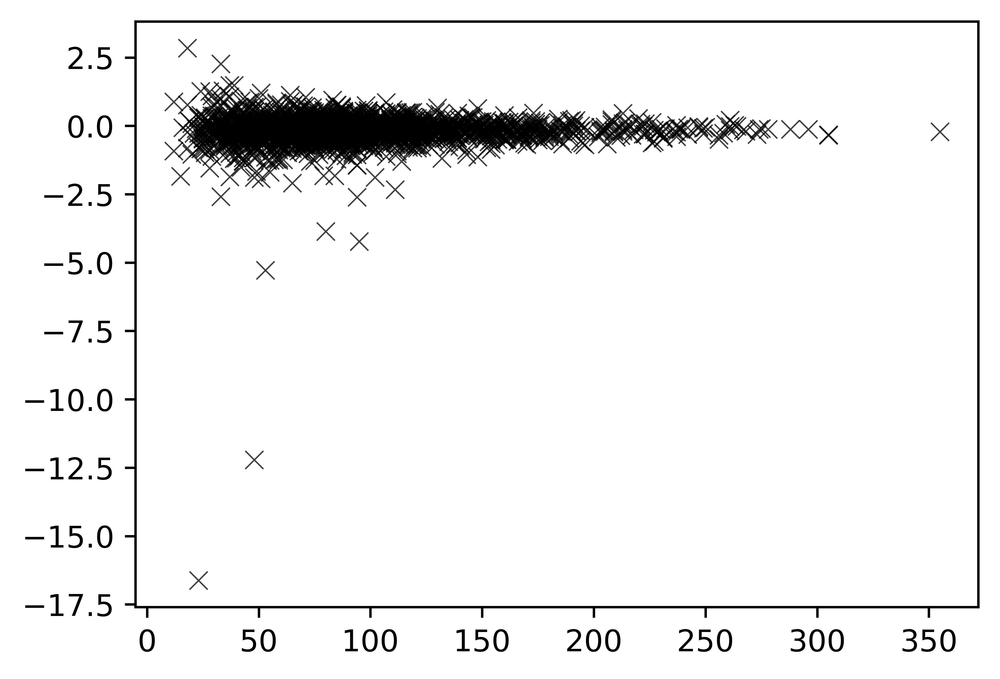

In [253]:
import scipy.stats 
plt.figure(figsize=(5, 3.5), dpi=400)
adata_obs_oi = adata.obs[adata.obs['MSI_status']=='MSI']
ax = sns.scatterplot(data=adata_obs_oi, x='NumSTRLoci', y='MSI_score', marker='x', alpha=0.75, color='black')
ax.set_xlabel('')
ax.set_ylabel('')
scipy.stats.pearsonr(adata_obs_oi['NumSTRLoci'], adata_obs_oi['MSI_score'])

PearsonRResult(statistic=0.17802134771694827, pvalue=3.147329865524529e-21)
PearsonRResult(statistic=0.02282653916156474, pvalue=0.3189807029823462)


<Figure size 2000x1400 with 0 Axes>

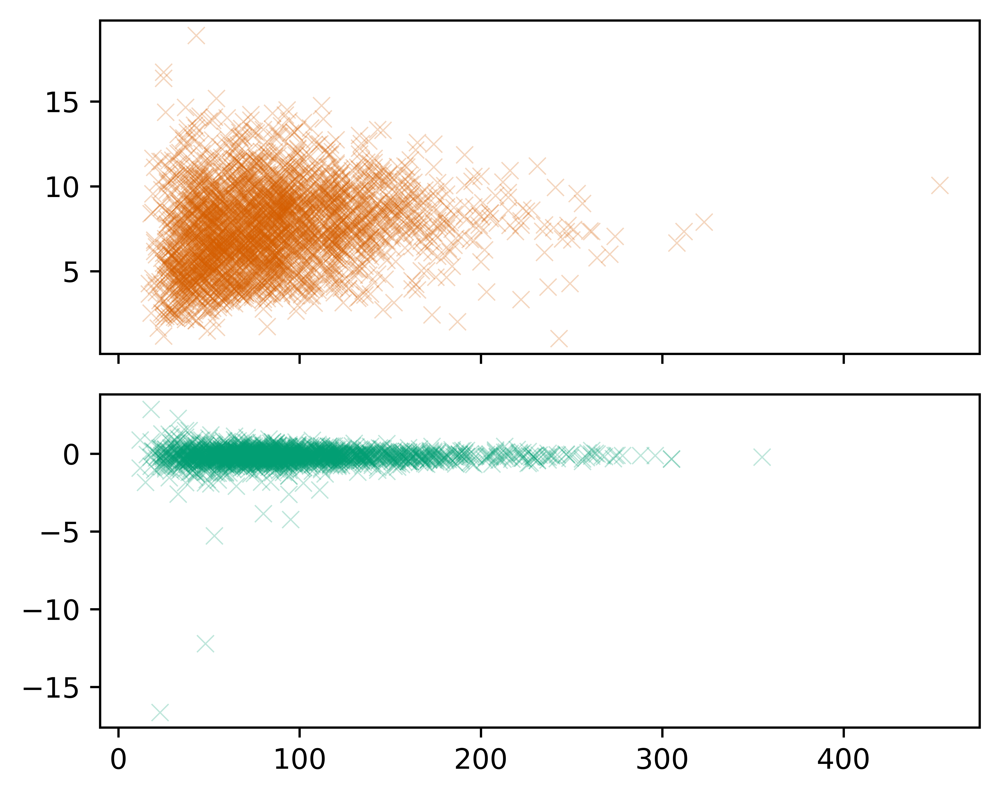

In [262]:
import scipy.stats 
plt.figure(figsize=(5, 3.5), dpi=400)
fig, axes = plt.subplots(2, 1, figsize=(5, 4), sharex=True, dpi=400)
adata_obs_oi = adata.obs[adata.obs['MSI_status']=='MSI']
ax1 = sns.scatterplot(data=adata_obs_oi, x='NumSTRLoci', y='MSI_score', marker='x', alpha=0.25, color=sns.color_palette('colorblind')[3], ax=axes[0])
ax1.set_xlabel('')
ax1.set_ylabel('')
# ax1.set_xticks([]);
print(scipy.stats.pearsonr(adata_obs_oi['NumSTRLoci'], adata_obs_oi['MSI_score']))
adata_obs_oi = adata.obs[adata.obs['MSI_status']=='MSS']
ax2 = sns.scatterplot(data=adata_obs_oi, x='NumSTRLoci', y='MSI_score', marker='x', alpha=0.25, color=sns.color_palette('colorblind')[2], ax=axes[1])
ax2.set_xlabel('')
ax2.set_ylabel('')
fig.tight_layout();
print(scipy.stats.pearsonr(adata_obs_oi['NumSTRLoci'], adata_obs_oi['MSI_score']))

In [233]:
import os
import glob 
import subprocess

DIR_BAM = '/node200data/18parkky/datasets/data/public/BAM/Kinker_et_al/*.bam'
for PATH_BAM in glob.glob(f'{DIR_BAM}'):
    samplename = os.path.basename(PATH_BAM).split('.')[0]
    cmd = f'samtools depth {PATH_BAM} -d 0 | gzip > depth.{samplename}.txt.gz'
    subprocess.call(cmd, shell=True)

samtools flagstat /node200data/18parkky/datasets/data/public/BAM/Kinker_et_al/Pool9_9.possorted_genome.bam > flagstat.Pool9_9.txt
samtools flagstat /node200data/18parkky/datasets/data/public/BAM/Kinker_et_al/Pool11_10.possorted_genome.bam > flagstat.Pool11_10.txt
samtools flagstat /node200data/18parkky/datasets/data/public/BAM/Kinker_et_al/Pool10_9.possorted_genome.bam > flagstat.Pool10_9.txt
samtools flagstat /node200data/18parkky/datasets/data/public/BAM/Kinker_et_al/Pool12_10.possorted_genome.bam > flagstat.Pool12_10.txt
samtools flagstat /node200data/18parkky/datasets/data/public/BAM/Kinker_et_al/Pool13_15.possorted_genome.bam > flagstat.Pool13_15.txt
samtools flagstat /node200data/18parkky/datasets/data/public/BAM/Kinker_et_al/Pool14_15.possorted_genome.bam > flagstat.Pool14_15.txt
samtools flagstat /node200data/18parkky/datasets/data/public/BAM/Kinker_et_al/Pool15_19.possorted_genome.bam > flagstat.Pool15_19.txt
samtools flagstat /node200data/18parkky/datasets/data/public/BAM/Kin

In [238]:
adata[adata.obs['MSI_status']=='MSS']

View of AnnData object with n_obs × n_vars = 1908 × 2000
    obs: 'index', 'CB', 'CellLine', 'PoolID', 'CancerType', 'n_genes', 'Identifier', 'AvgSTRDiff', 'StdSTRDiff', 'NumSTRLoci', 'AvgSTRDiff_scaled', 'StdSTRDiff_scaled', 'MSI_status', 'MSI_score', 'int_isMSI', 'MSI_score_scaled', 'MSI_score_log'
    var: 'GENE', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'CancerType_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'umap', 'MSI_status_colors', 'CellLine_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
samtools_depth_out.columns = 

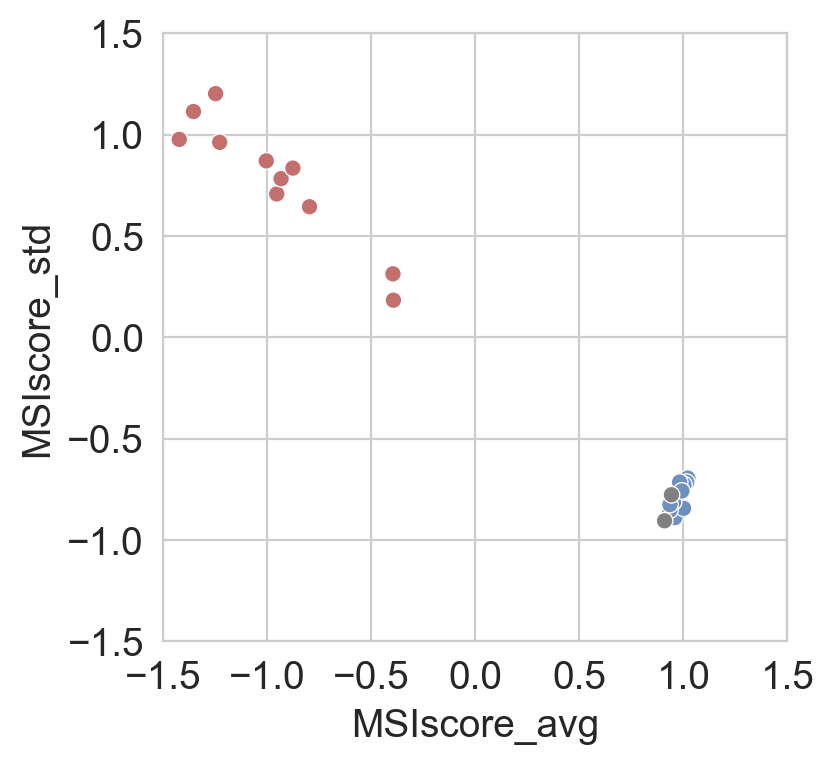

In [213]:
MSI_score_by_CellLine = list()
for CellLine, edf in adata.obs.groupby('CellLine'):
    MSI_score_by_CellLine.append( [CellLine, edf.iloc[0].MSI_status, np.mean(edf['AvgSTRDiff_scaled']), np.mean(edf['StdSTRDiff_scaled'])] )
MSI_score_by_CellLine = pd.DataFrame(MSI_score_by_CellLine, columns=['CellLine', 'MSI_status', 'MSIscore_avg', 'MSIscore_std'])

plt.figure(figsize=(4, 4), dpi=100)
ax = sns.scatterplot(data=MSI_score_by_CellLine, 
                x='MSIscore_avg', y='MSIscore_std', hue='MSI_status', 
                palette={ 
                    'MSI' : sns.color_palette('vlag_r')[0], 
                    'MSS' : sns.color_palette('vlag_r')[-1], 
                    'N/A' : 'gray'
                    }, 
                    legend=None,
                )

ax.set_xlim([-1.5, 1.5]);
ax.set_ylim([-1.5, 1.5]);
ax.xaxis.set_major_locator(ticker.MultipleLocator(.5))
ax.xaxis.set_major_formatter(ticker.ScalarFormatter())
ax.yaxis.set_major_locator(ticker.MultipleLocator(.5))
ax.yaxis.set_major_formatter(ticker.ScalarFormatter())

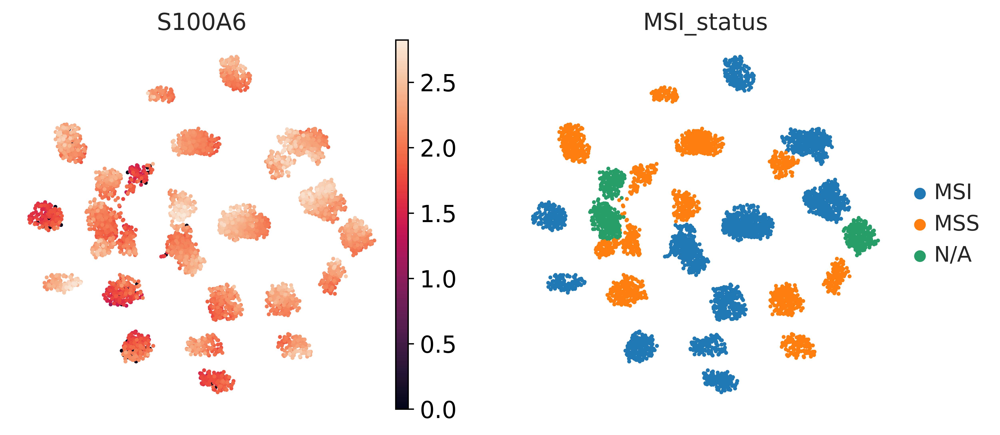

In [98]:
sc.pl.umap(adata, color=['S100A6', 'MSI_status'])

## cMS gene expression

/Users/18parkky/miniforge3/envs/cpdb/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/18parkky/miniforge3/envs/cpdb/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


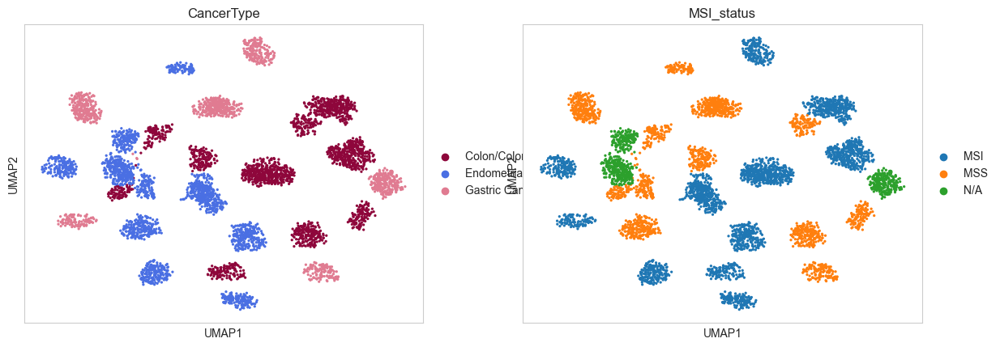

In [120]:
sc.pl.umap(adata, color=['CancerType', 'MSI_status'])

/Users/18parkky/miniforge3/envs/cpdb/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


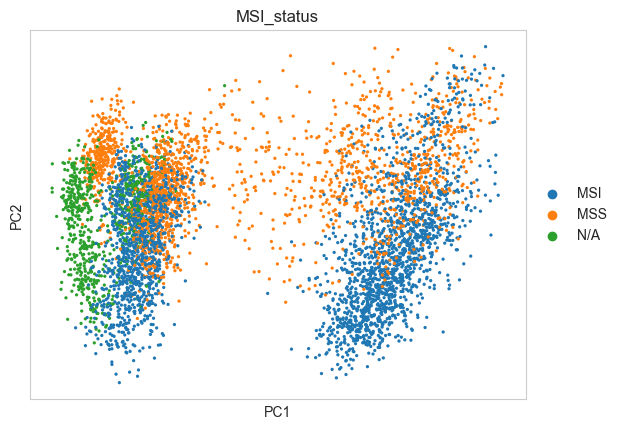

In [119]:
sc.pl.pca(adata, color=['MSI_status'])